In [202]:
import numpy as np
import cv2
import glob
import pickle
import matplotlib.pyplot as plt
%matplotlib inline

PATTERN_SIZE=(9, 6)

In [204]:
def load_calibration(filename):
    '''
    Loads a saved calibration
    '''
    contents = pickle.load(open(filename, 'rb'))
    return contents['camera_matrix'], contents['distortion_coefficients']
    
def calibrate(images_glob, pattern_size, draw_corners_path=None, save_calibration_filename=None):
    '''
    Return calibration values for the images found in images_glob
    '''
    object_points = np.zeros((pattern_size[0] * pattern_size[1], 3), np.float32)
    object_points[:,:2] = np.mgrid[0:pattern_size[0], 0:pattern_size[1]].T.reshape(-1,2)

    all_object_points = []
    all_image_points = []
    img_size = None

    for index, filename in enumerate(images_glob):
        image = cv2.imread(filename)
        
        if img_size is None:
            img_size = (image.shape[1], image.shape[0])
        if img_size[0] != image.shape[1] or img_size[1] != image.shape[0]:
            raise Exception('Image size should be the same for all images')

        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        ret, found_corners = cv2.findChessboardCorners(gray, pattern_size, None)
        if ret == False:
            continue

        all_object_points.append(object_points)
        all_image_points.append(found_corners)

        if draw_corners_path is not None:
            cv2.drawChessboardCorners(image, pattern_size, found_corners, ret)
            write_name = draw_corners_path + '/corners_found' + str(index + 1) + '.jpg'
            cv2.imwrite(write_name, image)
            
    _, camera_matrix, distortion_coefficients, _, _ = cv2.calibrateCamera(
        all_object_points, 
        all_image_points, 
        img_size, 
        None, 
        None
    )    
    
    if save_calibration_filename is not None:
        contents = {}
        contents['camera_matrix'] = camera_matrix
        contents['distortion_coefficients'] = distortion_coefficients        
        pickle.dump(contents, open(save_calibration_filename, 'wb'))
    return _, camera_matrix, distortion_coefficients, _, _

In [208]:
images = glob.glob('camera_cal/calibration*.jpg')

try:
    camera_matrix, distortion_coefficients = load_calibration('calibration.p')
    print('Loaded saved calibration file')
except FileNotFoundError:
    print('No saved calibration file found, re-calibrating...')
    _, camera_matrix, distortion_coefficients, _, _ = calibrate(
        images,  
        pattern_size=PATTERN_SIZE, 
        draw_corners_path='chessboards', 
        save_calibration_filename='calibration.p'
    )
    print('Regenerated and saved calibration')

Loaded saved calibration file


In [209]:
def corners_unwarp(img, nx, ny, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == False:
        return None, None
    
    # If we found corners, draw them! (just for fun)
    cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
    # Choose offset from image corners to plot detected corners
    # This should be chosen to present the result at the proper aspect ratio
    # My choice of 100 pixels is not exact, but close enough for our purpose here
    offset = 100 # offset for dst points
    # Grab the image shape
    img_size = (gray.shape[1], gray.shape[0])

    # For source points I'm grabbing the outer four detected corners
    src = np.float32([
        corners[0], 
        corners[nx - 1], 
        corners[-1], 
        corners[-nx]
    ])
    # For destination points, I'm arbitrarily choosing some points to be
    # a nice fit for displaying our warped result 
    # again, not exact, but close enough for our purposes
    dst = np.float32([
        [offset, offset], 
        [img_size[0] - offset, offset], 
        [img_size[0] - offset, img_size[1] - offset], 
        [offset, img_size[1] - offset]
    ])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M, img_size)

    # Return the resulting image and matrix
    return warped, M

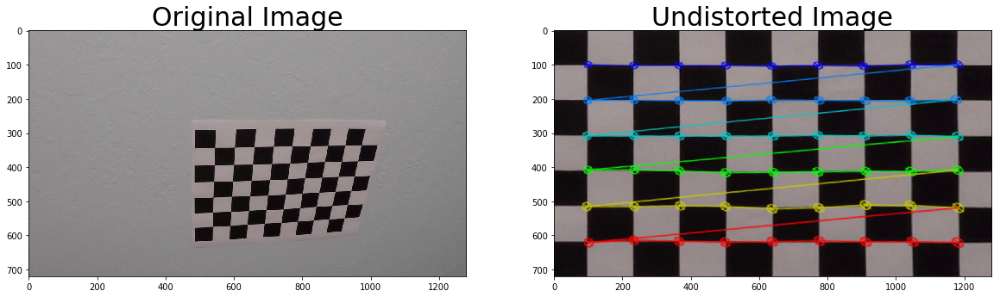

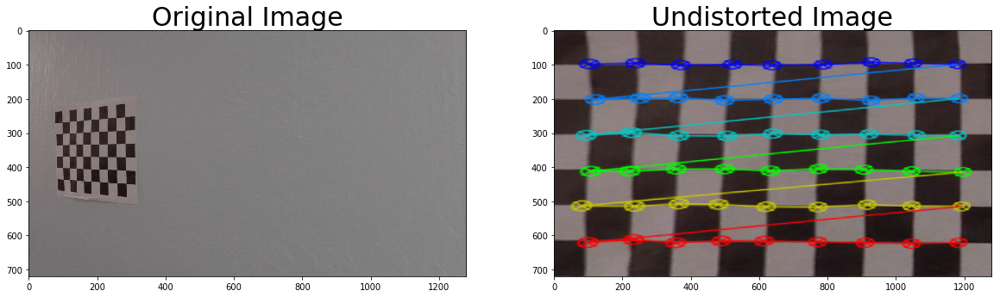

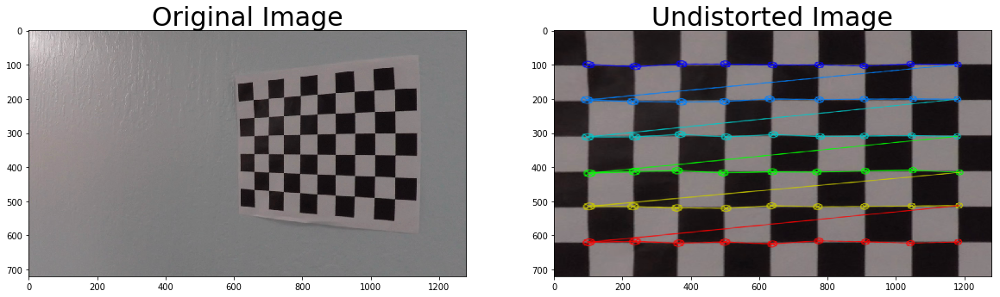

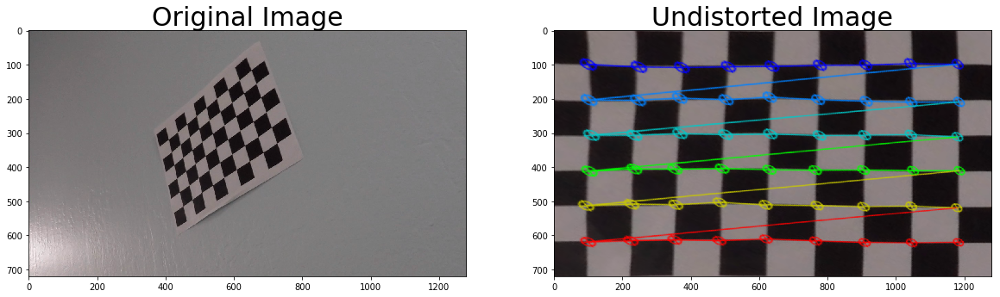

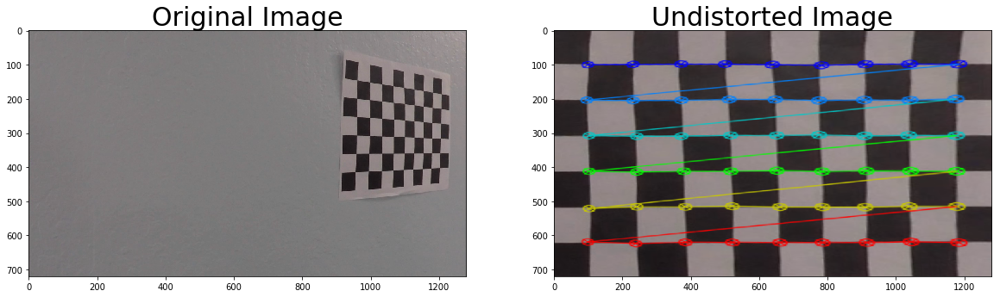

...

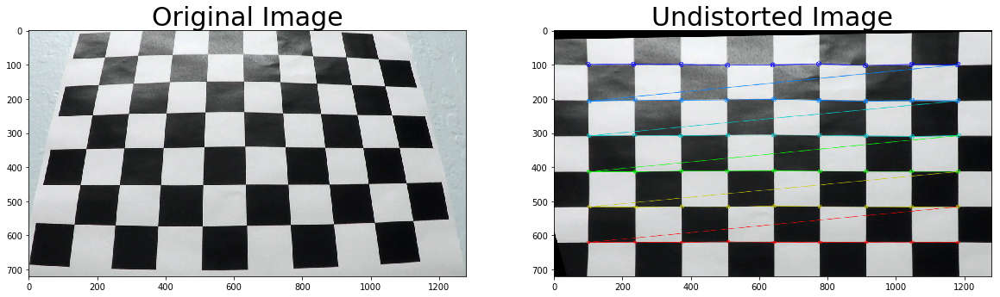

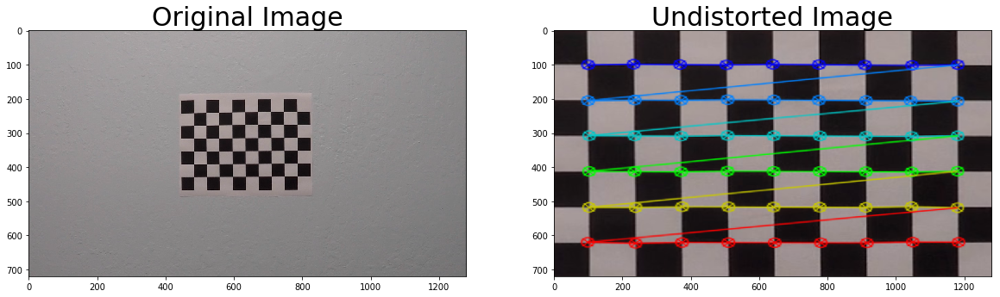

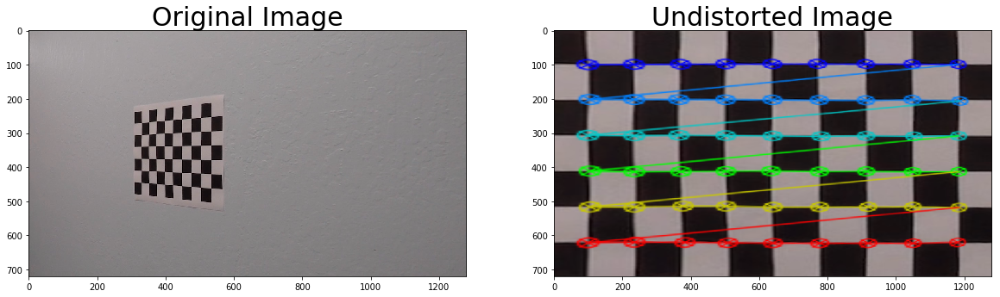

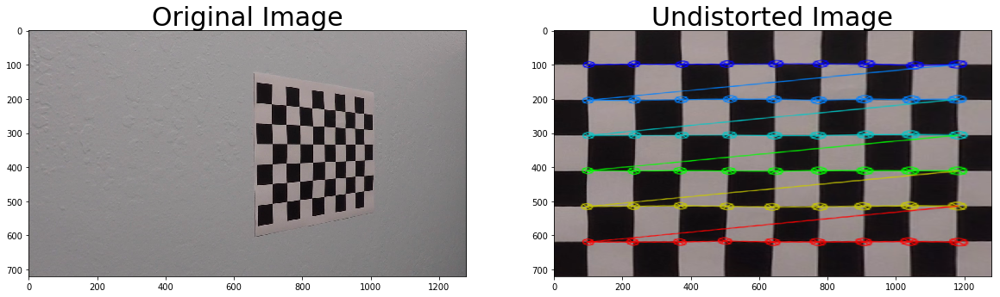

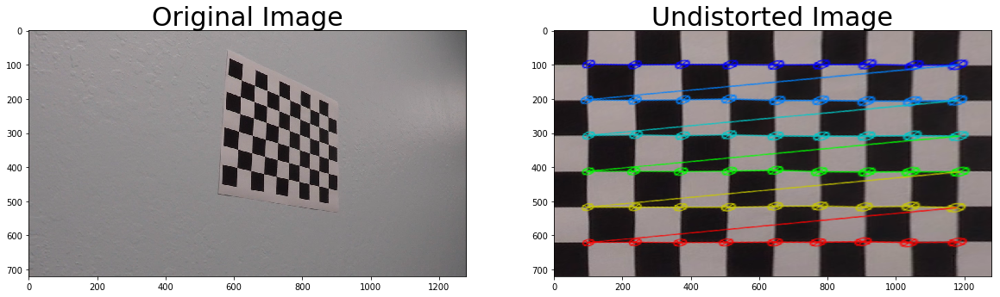

In [210]:
for index, filename in enumerate(images):
    img = cv2.imread(filename)
    img_size = (img.shape[1], img.shape[0])
    # warped = cv2.undistort(img, mtx, dist, None, mtx)
    warped, M = corners_unwarp(img, PATTERN_SIZE[0], PATTERN_SIZE[1], camera_matrix, distortion_coefficients)
    
    if warped is None:
        continue
        
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(warped)
    ax2.set_title('Undistorted Image', fontsize=30)

In [164]:
def shift_perspective(image, source_points, destination_points):
    image_size = (image.shape[1], image.shape[0])
    matrix = cv2.getPerspectiveTransform(source_points, destination_points)
    warped = cv2.warpPerspective(image, matrix, image_size)
    return warped

def warp_birds_eye(image):
    '''
    Shift perspective in image from looking down the road to a bird's-eye
    view above the camera looking straight down.
    '''
    (h, w) = (image.shape[0], image.shape[1])
    source_points = np.float32([
        [w / 2 - 76, h * .625], 
        [w / 2 + 76, h * .625], 
        [-100, h], 
        [w + 100, h]
    ])
    destination_points = np.float32([
        [100, 0], 
        [w - 100, 0], 
        [100, h], 
        [w - 100, h]
    ])    
    return shift_perspective(image, source_points, destination_points)

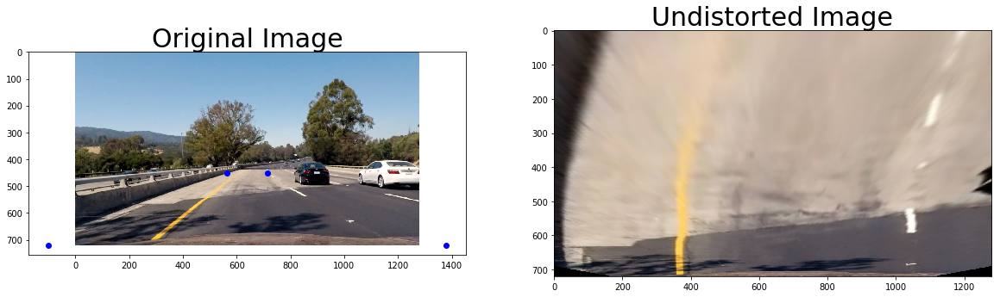

In [211]:
filename = 'test4'
image = cv2.imread('test_images/' + filename + '.jpg')
undistorted = cv2.undistort(image, camera_matrix, distortion_coefficients, None)
cv2.imwrite('test_images/processed/' + filename + '_undistorted.jpg', undistorted)
transformed_image = warp_birds_eye(undistorted)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
for point in source_points:
    ax1.plot(point[0], point[1], 'bo')
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(cv2.cvtColor(transformed_image, cv2.COLOR_BGR2RGB))
ax2.set_title('Undistorted Image', fontsize=30)

In [212]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def apply_thresholds(image):
    ksize = 3

    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0 * np.pi / 180, 10 * np.pi / 180))

    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    return gradx, grady, mag_binary, dir_binary, combined

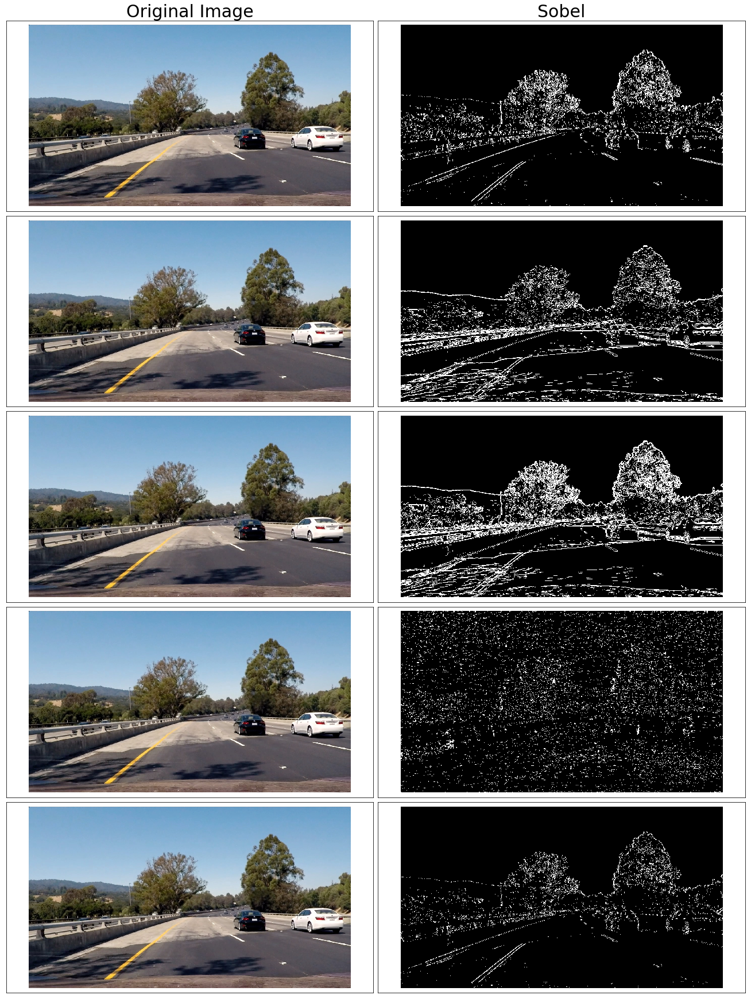

In [213]:
gradx, grady, mag_binary, dir_binary, combined = apply_thresholds(undistorted)

fig, axes = plt.subplots(nrows=5, ncols=2, sharex=True, sharey=True, figsize=(18, 24))

axes[0][0].set_title('Original Image', fontsize=30)
axes[0][1].set_title('Sobel', fontsize=30)

input_images = [cv2.cvtColor(image, cv2.COLOR_BGR2RGB)] * 5
sobel_images = [gradx, grady, mag_binary, dir_binary, combined]
for images, column in zip([input_images, sobel_images], axes.T):
    for img, ax in zip(images, column):
        ax.imshow(img, cmap='Greys_r')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
fig.tight_layout(pad=0.1)

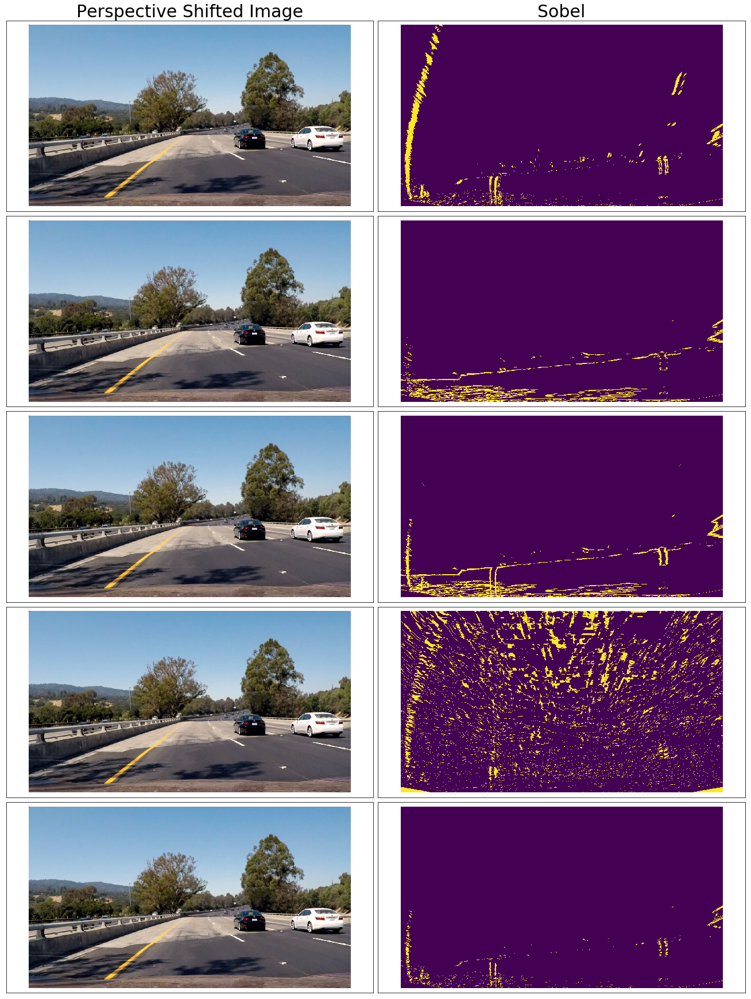

In [217]:
gradx, grady, mag_binary, dir_binary, combined = apply_thresholds(transformed_image)

fig, axes = plt.subplots(nrows=5, ncols=2, sharex=True, sharey=True, figsize=(18, 24))

axes[0][0].set_title('Perspective Shifted Image', fontsize=30)
axes[0][1].set_title('Sobel', fontsize=30)

input_images = [cv2.cvtColor(image, cv2.COLOR_BGR2RGB)] * 5
sobel_images = [gradx, grady, mag_binary, dir_binary, combined]
for images, column in zip([input_images, sobel_images], axes.T):
    for img, ax in zip(images, column):
        ax.imshow(img)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
fig.tight_layout(pad=0.1)

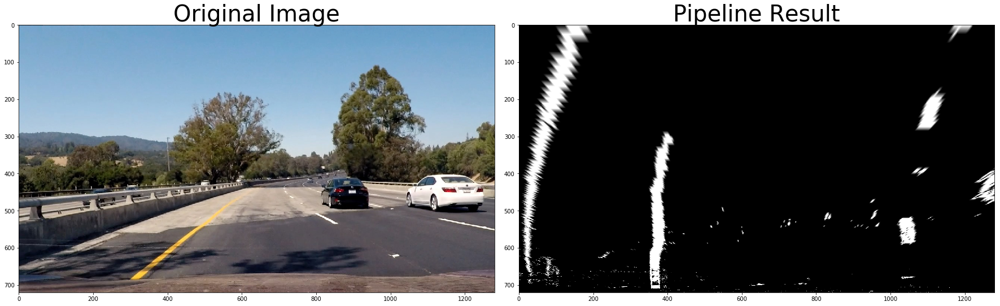

In [235]:
# Edit this function to create your own pipeline.
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0)
    abs_sobelx = np.absolute(sobelx)
    scaled_sobel = np.uint8(255 * abs_sobelx / np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    
    return color_binary
    
result = pipeline(image)
mask = np.zeros_like(result)
mask[ (result[:,:,1] > 0) | (result[:,:,2] > 0) ] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(mask, cmap='gray')
ax2.imshow(warp_birds_eye(mask), cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)